# Data Science Project : Covid Impact Tracing and Clustering

Identifying most impacted part of the world by COVID disease and exploring various regions of that part to understand most common venue/business/places around those regions to help determining strategy to impose isolation rules to control the spread of the disease

## A. Introduction

### 1. Business Problem:

#### 1.1 Problem Statement : 

With the increase of COVID disease, it is critical to impose strict isolation rules in severely impacted regions. However, as the disease is not expected to go away soon, it is also very important to avoid adverse impact on economy due to lockdown for a longer period. Regions with severe impact also cannot follow complete shutdown and hence it is crucial to understand which business/venues/places are more prone to spread of the disease and only those needs to follow strict rules, while the rest can observe little lighter rules to keep economy running and help reducing impact on day to day life of local residents.

At present we have several dashboards which shows location wise impact of the disease, but none of them provides view on what are the most common business/venues in those locations, which plays vital role in determining strategy to impose isolation and/or lockdown rules. Getting this full view on most common business/services around various regions with severity of the disease in those regions is challenging in absence of such dashboard.

#### 1.2 Goal Statement :

In this project, I primarily aim to - 

- Identify one of the most COVID impacted place of the world 
- Explore various regions of that place
- Cluster them together based on type of most common venues/businesses in surrounding area 
- Create visualizations to display region wise severity of the disease along with most common venues/businesses in those regions 

Achieving above goal will help our target audience to determine strategy to impose isolation and/or lockdown rules in each region and thus control the spread of the disease and minimize impact on economy

#### 1.3 Target Audience

##### Who can benefit from this project outcome?

- Local authorities and government of the severely impacted county/city to determine the best strategy to impose isolation/lockdown rules
- Local Police department to get strict isolation rules followed by public
- Local residents to understand severity of the disease by regions and venues/types of business


#### 1.4 Data Sources and API/Libraries

In order to perform my analysis, I would need various data including COVID cases statistics, location coordinates of various parts of the world, surrounding venues of the COVID impacted regions..etc. I will collect this information using following data sources.

##### Data will be collected from various sources as follows - 

 - [WHO](https://covid19.who.int/) : Country wise Total # of COVID cases across the world
 - [Worldometer-USA](https://www.worldometers.info/coronavirus/country/us/) : State wise Total # of COVID cases across USA
 - [Worldometer-California](https://www.worldometers.info/coronavirus/usa/california/) : County wise Toal # of COVID cases across state of California
 - [LA county public dashboard](http://dashboard.publichealth.lacounty.gov/covid19_surveillance_dashboard/) : Region wise Total # of COVID cases across Los Angeles county
 - The Geocoder Python library : Location Coordinates of various regions of Los Angeles county
 - Folium Python library : Visualize geographic details of region or place
 - Foursquare API : Explore various regions and find out most common venues around those regions to cluster them together
 - Choropleth Map : Visualize COVID severity across world/country/state/county and display clusters of most common venues superimposed on covid severity map

#### 1.5 Approach

I will utilize above data sources to perform our analysis and solve the problem described above. Below is the high level approach to indicate the flow of my analysis.

- Collect required data from various sources mentioned above and preprocess the data as per the need
- Utilize Choropleth map to visualize COVID impact on all the countries on world map on various factors like total # of cases, spread per 100k population, total cases in last 7 days..etc
- Pick the most impacted country in most aspects and visualize state wise impact of the disease on country using choropleth
- Pick the most impacted state and visualize county wise impact of the disease on state using choropleth
- Pick the most impacted county and visualize various regions of the county to understand severity of the disease
- Utilize Geocoder Python library to get coordinates of various regions of most impacted county
- Use Foursquare API to explore nearby venues of each the regions of selected county 
- Analyze the data using K-means clustering and superimpose clusters on the choropleth map showing COVID impact by various regions of the county
- Categorize each cluster based on top 3 most common venue and determine cluster wise COVID impact  
- From the results, conclude which are most impacted, moderately impacted and least impacted clusters;  which are most common venue types across impacted clusters and present the analysis recommending which venue types/businesses should follow strict lockdown rules

## B. Methodology

#### I will follow below steps to complete our analysis and present conclusion drawn from the results of our analysis

### Step 1: Import required python libraries to help with the analysis

In [159]:
import requests # library to handle requests
import pandas as pd # library for data analsysis
import numpy as np # library to handle data in a vectorized manner
import random # library for random number generation


!pip install beautifulsoup4
from bs4 import BeautifulSoup

!pip install lxml

!conda install -c conda-forge geopy --yes 
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

# map rendering library
import folium 

# import k-means from clustering stage
from sklearn.cluster import KMeans
from sklearn.preprocessing import MinMaxScaler

import json # library to handle JSON files
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# Matplotlib and associated plotting modules
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as colors

Solving environment: done

# All requested packages already installed.



## Covid cases by world countries

### B.1. Data Collection - world conuntries

### Step 2: Collect COVID cases counts by countries of the world

In [160]:
# load covid cases in world collected from WHO dashboard into pandas dataframe
df=pd.read_excel(r'World_covid_cases.xlsx')
df.head()

,Name,WHO Region,Cases - cumulative total,Cases - cumulative total per 100000 population,Cases - newly reported in last 7 days,Deaths - cumulative total,Deaths - cumulative total per 100000 population,Deaths - newly reported in last 7 days,Transmission Classification
0,Global,NaN,108153741,1385.4655,2633717,2381295,30.504743,75928,NaN
1,United States of America,Americas,27130272,8196.3900,582295,471765,142.530000,16030,Community transmission
2,India,South-East Asia,10904940,790.2100,78577,155642,11.280000,646,Clusters of cases
3,Brazil,Americas,9765455,4594.2200,318290,237489,111.730000,7455,Community transmission
4,Russian Federation,Europe,4071883,2790.2100,104602,80126,54.910000,3465,Clusters of cases


### B.2 Data Pre-processing - world countries

In [161]:
# drop extra column not required for analysis
df.drop(columns='Transmission Classification',axis=1,inplace=True) 
# drop first row being summary row for all coutries (global)
df.drop(axis=0,index=0,inplace=True) 
df.reset_index()
df.head()

,Name,WHO Region,Cases - cumulative total,Cases - cumulative total per 100000 population,Cases - newly reported in last 7 days,Deaths - cumulative total,Deaths - cumulative total per 100000 population,Deaths - newly reported in last 7 days
1,United States of America,Americas,27130272,8196.39,582295,471765,142.53,16030
2,India,South-East Asia,10904940,790.21,78577,155642,11.28,646
3,Brazil,Americas,9765455,4594.22,318290,237489,111.73,7455
4,Russian Federation,Europe,4071883,2790.21,104602,80126,54.91,3465
5,The United Kingdom,Europe,4027110,5932.16,97271,116908,172.21,4816


##### Rename columns to reduce column names length

In [162]:
df_covid = df.rename(columns={'Name':'Country','WHO Region':'Region','Cases - cumulative total':'Total Cases','Cases - cumulative total per 100000 population':'Total Cases per 100k','Cases - newly reported in last 7 days':'New Cases (in 7 days)','Deaths - cumulative total':'Total Deaths','Deaths - cumulative total per 100000 population':'Total Deaths per 100k','Name':'Country','Name':'Country','Deaths - newly reported in last 7 days':'New Deaths (in 7 days)'},inplace=False)
df_covid.head()

,Country,Region,Total Cases,Total Cases per 100k,New Cases (in 7 days),Total Deaths,Total Deaths per 100k,New Deaths (in 7 days)
1,United States of America,Americas,27130272,8196.39,582295,471765,142.53,16030
2,India,South-East Asia,10904940,790.21,78577,155642,11.28,646
3,Brazil,Americas,9765455,4594.22,318290,237489,111.73,7455
4,Russian Federation,Europe,4071883,2790.21,104602,80126,54.91,3465
5,The United Kingdom,Europe,4027110,5932.16,97271,116908,172.21,4816


### B.3 Data Visualization - world countries

### Step 3 : Visualize COVID impact on various countries on world map

#### 3.1 Visualize impact by total # of cases

In [163]:
# geojson file
world_geo = r'world_countries.json' 
# create a plain world map, focusing in the center of the world
world_map = folium.Map(location=[0, 0], zoom_start=2) #tiles='stamenwatercolor'

# create a numpy array of length 6 and has linear spacing from the minium total cases to the maximum total cases
threshold_scale = np.linspace(df_covid['Total Cases'].min(),
                              df_covid['Total Cases'].max(),
                              6, dtype=int)

# change the numpy array to a list
threshold_scale = threshold_scale.tolist()

# keep the last value of the list greater than the maximum cases
threshold_scale[-1] = threshold_scale[-1] + 1 

# generate choropleth map based on total # of cases by country
world_map.choropleth(
    geo_data=world_geo,
    data=df_covid,
    columns=['Country','Total Cases'],
    key_on='feature.properties.name',
    threshold_scale=threshold_scale,
    fill_color='YlOrRd', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    highlight=True,
    legend_name='World Total COVID Cases'
)

# display map
world_map

#### 3.2 Visualize impact by total # of cases per 100k population

In [164]:
world_geo = r'world_countries.json'
world_map = folium.Map(location=[0, 0], zoom_start=2)

threshold_scale = np.linspace(df_covid['Total Cases per 100k'].min(),
                              df_covid['Total Cases per 100k'].max(),
                              6, dtype=int)
threshold_scale = threshold_scale.tolist() 
threshold_scale[-1] = threshold_scale[-1] + 1 

world_map.choropleth(
    geo_data=world_geo,
    data=df_covid,
    columns=['Country', 'Total Cases per 100k'],
    key_on='feature.properties.name',
    threshold_scale=threshold_scale,
    fill_color='YlOrRd', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='World COVID Cases per 100k population',
    reset=True
)
world_map

#### 3.2 Visualize impact by new cases reported in last 7 days

In [165]:
world_geo = r'world_countries.json'
world_map = folium.Map(location=[0, 0], zoom_start=2)

threshold_scale = np.linspace(df_covid['New Cases (in 7 days)'].min(),
                              df_covid['New Cases (in 7 days)'].max(),
                              6, dtype=int)
threshold_scale = threshold_scale.tolist() 
threshold_scale[-1] = threshold_scale[-1] + 1 

world_map.choropleth(
    geo_data=world_geo,
    data=df_covid,
    columns=['Country', 'New Cases (in 7 days)'],
    key_on='feature.properties.name',
    threshold_scale=threshold_scale,
    fill_color='YlOrRd', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='World Total COVID Cases in last 7 days',
    reset=True
)
world_map

#### Conclusion : 

As we can see from above visualizations, some of the countries have more number of total cases due to their higher population, however when we compare countries by total#of cases per 100k population, those are not on the top of the list. However, USA is the only country which is leading the list in every category, and hence is most severely impacted country of the world by COVID. I will focus on USA only for my further analysis.

## Covid cases by states of USA - the most impacted country of the world

### B.1 Data Collection - USA States

### Step 4: Collect COVID cases results by various states of USA

#### Scrap worldometer page to pull statewise COVID data for USA

In [166]:
url=("https://www.worldometers.info/coronavirus/country/us/")
response=requests.get(url)

#### Utilize python BeautifulSoup package to parse data as html

In [167]:
soup = BeautifulSoup(response.text, 'html.parser')
#usa_states_covid=soup.find('table',{'class':"table table-bordered table-hover table-responsive usa_table_countries dataTable no-footer"})
usa_states_covid=soup.find_all(id='usa_table_countries_today')

#### Use pandas html reader to convert html into pandas dataframe for further analysis

In [168]:
df_usa_states=pd.read_html(str(usa_states_covid))
df_usa_states=pd.DataFrame(df_usa_states[0])
df_usa_states.head()

,#,USAState,TotalCases,NewCases,TotalDeaths,NewDeaths,TotalRecovered,ActiveCases,Tot Cases/1M pop,Deaths/1M pop,TotalTests,Tests/ 1M pop,Population,Source,Projections
0,NaN,USA Total,30844462,"+69,989",561033.0,"+1,179",23264100.0,7019329.0,93185.0,1695.0,396978754.0,1199322.0,NaN,NaN,NaN
1,1.0,California,3655516,"+1,888",58232.0,+172,1931543.0,1665741.0,92516.0,1474.0,52962296.0,1340403.0,39512223.0,[view by county] [1],[projections]
2,2.0,Texas,2778030,"+3,020",48180.0,+120,2621204.0,108646.0,95808.0,1662.0,25222325.0,869859.0,28995881.0,[view by county] [1] [2] [3],[projections]
3,3.0,Florida,2033179,"+5,750",33133.0,+158,1450531.0,549515.0,94664.0,1543.0,24831158.0,1156135.0,21477737.0,[view by county] [1] [2] [3],[projections]
4,4.0,New York,1872970,"+7,443",50147.0,+54,1040527.0,782296.0,96279.0,2578.0,43852610.0,2254220.0,19453561.0,[view by county] [1] [2] [3],[projections]


### B.2 Data Pre-processing - USA States

#### Clean data columns

In [169]:
# drop additional columns not required for our analysis
df_usa_states.drop(columns=['#','TotalDeaths','NewDeaths','TotalRecovered','ActiveCases',"Deaths/1M pop",'TotalTests',"Tests/ 1M pop",'Source','Projections'],axis=1,inplace=True)
# Rename column
df_usa_states.rename(columns={df_usa_states.columns[3]: 'Total_Cases_per_1M_pop'},inplace=True) 
df_usa_states.head()

,USAState,TotalCases,NewCases,Total_Cases_per_1M_pop,Population
0,USA Total,30844462,"+69,989",93185.0,NaN
1,California,3655516,"+1,888",92516.0,39512223.0
2,Texas,2778030,"+3,020",95808.0,28995881.0
3,Florida,2033179,"+5,750",94664.0,21477737.0
4,New York,1872970,"+7,443",96279.0,19453561.0


#### Clean data

In [170]:
# Replace NaN in NewCases column with 0
df_usa_states['NewCases']=df_usa_states['NewCases'].replace(np.nan,0)
# Remove all rows where Population is NaN and assign to new dataframe df_usa
df_usa=df_usa_states.dropna(subset = ["Population"])
# Convert Total_Cases_per_1M_pop & Population values to integer
df_usa.iloc[:,[3,4]] = df_usa.iloc[:,[3,4]].astype(int)
#df_usa.Population = df_usa.Population.astype(int)
df_usa.head()

/home/jupyterlab/conda/envs/python/lib/python3.6/site-packages/pandas/core/indexing.py:1715: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, v)


,USAState,TotalCases,NewCases,Total_Cases_per_1M_pop,Population
1,California,3655516,"+1,888",92516,39512223
2,Texas,2778030,"+3,020",95808,28995881
3,Florida,2033179,"+5,750",94664,21477737
4,New York,1872970,"+7,443",96279,19453561
5,Illinois,1232900,"+3,002",97295,12671821


In [171]:
# Validate that the columns used for analysis are in appropriate data types
df_usa.dtypes

USAState                  object
TotalCases                 int64
NewCases                  object
Total_Cases_per_1M_pop     int64
Population                 int64
dtype: object

### B.3 Data Visualization - USA States

### Step 5 : Visualize COVID impact in various states on USA map

#### 5.1 : Visualize impact by total # of cases

In [172]:
usa_geo = r'usa_states_geojason.json'

# create a numpy array of length 6 and has linear spacing from the minium total cases to the maximum total cases
threshold_scale = np.linspace(df_usa['TotalCases'].min(),
                              df_usa['TotalCases'].max(),
                              6, dtype=int)

# change the numpy array to a list
threshold_scale = threshold_scale.tolist() 

# Keeping the last value of the list greater than the maximum cases
threshold_scale[-1] = threshold_scale[-1] + 1 

# Center the map at USA 
usa_map = folium.Map(location=[44.427963,-110.58845500000001], zoom_start=4)
usa_map.choropleth(
    geo_data=usa_geo,
    data=df_usa,
    columns=['USAState', 'TotalCases'],
    key_on='feature.properties.NAME',
    threshold_scale=threshold_scale,
    fill_color='YlOrRd', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='USA State wise Total COVID Cases',
    reset=True
)
usa_map

#### 5.2 : Visualize impact by total # of cases per 1M polulation

In [173]:
usa_geo = r'usa_states_geojason.json'

# create a numpy array of length 6 and has linear spacing from the minium total cases to the maximum total cases
threshold_scale = np.linspace(df_usa['Total_Cases_per_1M_pop'].min(),
                              df_usa['Total_Cases_per_1M_pop'].max(),
                              6, dtype=int)

# change the numpy array to a list
threshold_scale = threshold_scale.tolist() 

# Keeping the last value of the list greater than the maximum cases
threshold_scale[-1] = threshold_scale[-1] + 1 

usa_map = folium.Map(location=[44.427963,-110.58845500000001], zoom_start=4)
usa_map.choropleth(
    geo_data=usa_geo,
    data=df_usa,
    columns=['USAState', 'Total_Cases_per_1M_pop'],
    key_on='feature.properties.NAME',
    threshold_scale=threshold_scale,
    fill_color='YlOrRd', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='USA State wise Total COVID Cases per 1M Population',
    reset=True
)
usa_map

#### Conclusion :

As we can see from above analysis of USA states, California is leading the show in terms of total# of cases. There are other states which are more impacted when we consider # of cases per 1 million of population. However, California is not far behind in this category as well, and hence being one of the most populated state, my further analysis will be focused on California state

## Covid cases by counties of California State - one of the most impacted State of USA

### B.1 Data Collection - California Counties

### Step 6: Collect COVID cases results by various counties of California

#### Scrap  worldometer page to pull COVID data for various counties in California

In [174]:
url=("https://www.worldometers.info/coronavirus/usa/california/")
response=requests.get(url)

#### Utilize BeautifulSoup package to parse the data via html

In [175]:
soup = BeautifulSoup(response.text, 'html.parser')
california_covid=soup.find_all(id='usa_table_countries_today')

#### Use pandas html reader to convert html into pandas dataframe for further analysis

In [176]:
df_california=pd.read_html(str(california_covid))
df_california=pd.DataFrame(df_california[0])
df_california.head()

,County,TotalCases,NewCases,TotalDeaths,NewDeaths,ActiveCases,TotalTests,Source
0,California Total,3655516.0,"+1,888",58232.0,173.0,1665741.0,52962296.0,NaN
1,Los Angeles,1216250.0,NaN,23020.0,NaN,NaN,6041144.0,[county] [state]
2,Riverside,293831.0,+124,4248.0,34.0,3203.0,2681356.0,[county] [state]
3,San Bernardino,290315.0,+160,3868.0,65.0,1310.0,2668421.0,[county] [state]
4,San Diego,268627.0,NaN,3520.0,NaN,4100.0,4207106.0,[county] [state]


### B.2 Data Pre-processing - California Counties

In [177]:
# Remove records with Nan values
df_california=df_california.dropna(subset = ["Source"])
df_california=df_california.dropna(subset = ["TotalCases"])
# drop unnecessary columns not required for analysis
df_california.drop(columns=['NewDeaths','ActiveCases','TotalTests','Source'],axis=1,inplace=True)
#df_usa.drop(axis=0,index=0,inplace=True)
#df_usa.drop(labels='Total',axis=0,inplace=True)
df_california.head()

,County,TotalCases,NewCases,TotalDeaths
1,Los Angeles,1216250.0,NaN,23020.0
2,Riverside,293831.0,+124,4248.0
3,San Bernardino,290315.0,+160,3868.0
4,San Diego,268627.0,NaN,3520.0
5,Orange,265536.0,+180,4684.0


In [178]:
#Replace NaN in NewCases and TotalDeaths columns with 0
df_california['NewCases']=df_california['NewCases'].replace(np.nan,0)
df_california['TotalDeaths']=df_california['TotalDeaths'].replace(np.nan,0)
df_california.head()

,County,TotalCases,NewCases,TotalDeaths
1,Los Angeles,1216250.0,0,23020.0
2,Riverside,293831.0,+124,4248.0
3,San Bernardino,290315.0,+160,3868.0
4,San Diego,268627.0,0,3520.0
5,Orange,265536.0,+180,4684.0


In [179]:
# Convert the columns to be used for analysis into integer
df_california.iloc[:,[1,3]] = df_california.iloc[:,[1,3]].astype(int)
df_california.dtypes

County         object
TotalCases      int64
NewCases       object
TotalDeaths     int64
dtype: object

### B.3 Data Visualization - California Counties

### Step 7 : Visualize COVID impact in various counties of California on USA map

#### 7.1 : Visualize impact by total # of cases per county

In [180]:
ca_geo = r'usa_county_geojason.json'

# create a numpy array of length 6 and has linear spacing from the minium total cases to the maximum total cases
threshold_scale = np.linspace(df_california['TotalCases'].min(),
                              df_california['TotalCases'].max(),
                              6, dtype=int)

# change the numpy array to a list
threshold_scale = threshold_scale.tolist() 

# Keeping the last value of the list greater than the maximum cases
threshold_scale[-1] = threshold_scale[-1] + 1 

# Keep the focus on Californiaa in map
ca_map = folium.Map(location=[36.778261,-119.41793239999998], zoom_start=6)
ca_map.choropleth(
    geo_data=ca_geo,
    data=df_california,
    columns=['County', 'TotalCases'],
    key_on='feature.properties.NAME',
    threshold_scale=threshold_scale,
    fill_color='YlOrRd', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='California county wise Total COVID Cases',
    reset=True
)
ca_map

#### Conclusion

As we can see from above, Los Angeles has highest number of cases and being largest and one of the most populated city, I will focus my analysis on Los Angeles county and surroundings from here and find out what all regions of LA county are severely impacted and require strict isolation rules to reduce the spread of the disease

## Covid cases by regions of Los Angeles - one of the most impacted county of California state

### B.1 Data Collection - Los Angeles Neighbourhood Regions

#### Step 8 : Collect COVID cases for various neighbourhoods of Los Angeles county

In [181]:
# Read data from static excel pulled based on LA county portal and put it in pandas dataframe for further analysis
df_la=pd.read_excel(r'LA_County_Covid_Cases.xlsx')
#df_la=pd.read_excel(r'Test.xlsx')
df_la.head()

,Unnamed: 0,Neighbourhood,Region,Total_cases,case_rate_final,adj_case_rate_final,deaths_final,death_rate_final,adj_death_rate_final,population
0,1,Acton,Acton,425,5332,5917,7,88,64,7971
1,2,Adams-Normandie,Adams-Normandie,1129,13765,13348,15,183,183,8202
2,3,City of Agoura Hills,Agoura Hills,930,4453,4528,13,62,60,20883
3,4,Agua Dulce,Agua Dulce,246,5916,7598,2,48,28,4158
4,5,City of Alhambra,Alhambra,6544,7546,7523,170,196,140,86724


### B.2 Data pre-processing - Los Angeles Neighbourhood Regions

##### Take only required columns for our analysis and drop unwanted rows

In [182]:
df_la= df_la[['Neighbourhood','Region','Total_cases','population']]
# Drop all the records where 'Total_cases' are 0
df_la.drop(df_la.index[df_la.loc[:,'Total_cases'] == 0], inplace = True)
df_la=df_la.reset_index()
df_la.head(8)

,index,Neighbourhood,Region,Total_cases,population
0,0,Acton,Acton,425,7971
1,1,Adams-Normandie,Adams-Normandie,1129,8202
2,2,City of Agoura Hills,Agoura Hills,930,20883
3,3,Agua Dulce,Agua Dulce,246,4158
4,4,City of Alhambra,Alhambra,6544,86724
5,5,Altadena,Altadena,3083,43620
6,6,City of Arcadia,Arcadia,2541,57754
7,7,Arcadia,Arcadia,584,7981


##### Some of the regions have city and village neighbourhood listed separately, we will aggregate those in a single region to addup cases

In [183]:
df_la_covid=df_la.groupby('Region').sum().reset_index()
df_la_covid.head(8)

,Region,index,Total_cases,population
0,Acton,0,425,7971
1,Adams-Normandie,1,1129,8202
2,Agoura Hills,2,930,20883
3,Agua Dulce,3,246,4158
4,Alhambra,4,6544,86724
5,Altadena,5,3083,43620
6,Arcadia,13,3125,65735
7,Arleta,8,6750,34370


##### Create a new columns called 'Case_Percentage' to find out %age of infected population for each neighbourhood region of LA county

In [184]:
df_la_covid['Case_Percentage']= round(100*df_la_covid['Total_cases']/df_la_covid['population'],2)
df_la_covid_sorted = df_la_covid.sort_values(by=['Total_cases'],ascending=False, inplace=False)
df_la_covid_sorted.head(10)

,Region,index,Total_cases,population,Case_Percentage
53,East Los Angeles,60,24217,125269,19.33
140,Pomona,313,23575,157869,14.93
131,Palmdale,291,23353,159810,14.61
65,Florence-Firestone,147,22051,112150,19.66
105,Lancaster,118,20662,161570,12.79
126,North Hollywood,140,19454,151421,12.85
157,Santa Clarita,174,18543,220424,8.41
68,Glendale,77,18091,206493,8.76
165,South Gate,183,17892,98155,18.23
22,Boyle Heights,24,16928,86884,19.48


#### Now, we have details of total # of COVID cases for each neighbourhood region of LA county. 

Next I will perform following tasks to achieve the goal to help target audience of this project - 

- Find out location co-ordinates of all neighbourhood regions of Los Angeles county
- Show those regions in the map of LA to visualize severity of COVID for each region using choropleth map
- Explore and Analyze nearby venues of each region using Foursquare API
- Create clusters using K-means and assign cluster label to each region
- Find out total %age of COVID infection in each cluster, to determine which which clusters are severely impacted
- Identify most common venues in each cluster and assign veny lable to each cluster accordingly
- Superimpose clusters on choropleth map showing COVID severity of all the regions of LA county
- Draw conclusion based on the findings from above analysis

### Step 9 : Utilize Python Geocoder library to get location co-ordintes for each neighbourhood region of LA county

In [185]:
# Install geocoder package
!pip install geocoder
import geocoder
print("geocode successfully imported")

geocode successfully imported


##### Now, we will use function get_lat_lon to get latitude and longitude of each region and enrich our dataframe with location co-ordinates for each region

In [186]:
def get_lat_lon(Region):
    print('Trying to get coordinates for {}'.format(Region))
    lat_lon = None
    while not lat_lon:
        geo_str = '{}, Los Angeles County, California'.format(Region)
        g = geocoder.arcgis(geo_str)
        lat_lon = g.latlng
    print('Successfully got coordinates for {}'.format(Region))
    return lat_lon

In [187]:
# function call for each region in our dataframe to get latitide and longitude
lat_lon_df = df_la_covid[['Region']].applymap(get_lat_lon)

Trying to get coordinates for Acton
Successfully got coordinates for Acton
Trying to get coordinates for Adams-Normandie
Successfully got coordinates for Adams-Normandie
Trying to get coordinates for Agoura Hills
Successfully got coordinates for Agoura Hills
Trying to get coordinates for Agua Dulce
Successfully got coordinates for Agua Dulce
Trying to get coordinates for Alhambra
Successfully got coordinates for Alhambra
Trying to get coordinates for Altadena
Successfully got coordinates for Altadena
Trying to get coordinates for Arcadia
Successfully got coordinates for Arcadia
Trying to get coordinates for Arleta
Successfully got coordinates for Arleta
Trying to get coordinates for Artesia
Successfully got coordinates for Artesia
Trying to get coordinates for Atwater Village
Successfully got coordinates for Atwater Village
Trying to get coordinates for Avalon
Successfully got coordinates for Avalon
Trying to get coordinates for Avocado Heights
Successfully got coordinates for Avocado 

In [188]:
print("size of dataframe with latitude and longitude are received successfully : ", lat_lon_df.shape)

size of dataframe with latitude and longitude are received successfully :  (213, 1)


In [189]:
# Add latitude and longitude back to our dataframe
df_la_covid['Latitude'] = lat_lon_df.Region.map(lambda x: x[0])
df_la_covid['Longitude'] = lat_lon_df.Region.map(lambda x: x[1])
# copy into new dataframe calles la_data, which will be our source now for further analysis
la_data =df_la_covid.copy()
la_data.head()

,Region,index,Total_cases,population,Case_Percentage,Latitude,Longitude
0,Acton,0,425,7971,5.33,34.468150,-118.195130
1,Adams-Normandie,1,1129,8202,13.76,33.901212,-118.299321
2,Agoura Hills,2,930,20883,4.45,34.146110,-118.778120
3,Agua Dulce,3,246,4158,5.92,34.495700,-118.326210
4,Alhambra,4,6544,86724,7.55,34.094420,-118.127780


#### ONLY 20 points to reduce number of calls to foursquare API for testing

In [190]:
# As there are limitations to make # of calls to Foursquare API per day, uncomment following line to consider only 20 regions for API call, if required. 
# Comment it if no such restriction required
#la_data=la_data.head(20)
#la_data=la_data.iloc[143]
la_data.head()

,Region,index,Total_cases,population,Case_Percentage,Latitude,Longitude
0,Acton,0,425,7971,5.33,34.468150,-118.195130
1,Adams-Normandie,1,1129,8202,13.76,33.901212,-118.299321
2,Agoura Hills,2,930,20883,4.45,34.146110,-118.778120
3,Agua Dulce,3,246,4158,5.92,34.495700,-118.326210
4,Alhambra,4,6544,86724,7.55,34.094420,-118.127780


### Step 10: Get Los Angeles location coordinates and create visualization to show various regions of LA county on map

In [191]:
address = 'Los Angeles, USA'

geolocator = Nominatim(user_agent="la_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of Los Angeles are {}, {}.'.format(latitude, longitude))

The geograpical coordinate of Los Angeles are 34.0536909, -118.242766.


### B.3 Data Visualization - Los Angeles Neighbourhood Regions

#### Create a map centered at LA and showing all regions of LA county

In [192]:
map_la = folium.Map(location=[latitude, longitude], zoom_start=10)

# add markers to map
for lat, lng, label in zip(la_data['Latitude'], la_data['Longitude'], la_data['Region']):
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=3,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_la)  
    
map_la

### Step 11 : Use Foursquare API to explore surroundings venues of each region

#### Get Foursquare client details

In [193]:
CLIENT_ID = 'ED241ANR5K1U1RBMVCADCPFAKHNOW3QFEOHXZDYXJZZV20GM' # Foursquare client ID
CLIENT_SECRET = 'XGEJP10OPKWB1LWWNG21MEOUZRZOO4CGFQBF5JOUHQHUM0CE' # Foursquare client Secret
VERSION = '20180605' # Foursquare API version
LIMIT = 100 # A default Foursquare API limit value

print('Client credentails:')
print('CLIENT_ID: ' )
print('CLIENT_SECRET: ')

Client credentails:
CLIENT_ID: 
CLIENT_SECRET: 


#### Create URL to include top 100 locations within 1500 meter radious of each region of LA county 

In [194]:
LIMIT = 100
radius = 1500
latitude = 34.0536909 # LA latitude
longitude = -118.242766 # LA longitude

url = 'https://api.foursquare.com/v2/venues/explore?client_id={}&client_secret={}&ll={},{}&v={}&radius={}&limit={}'.format(CLIENT_ID, CLIENT_SECRET, latitude, longitude, VERSION, radius, LIMIT)

#### Get results of url into results variable

In [195]:
results = requests.get(url).json()

### B.4 Exploring and Analyzing various regions of Los Angeles county

#### Function to get 100 nearby venues and corresponding venue category within 1500 meter radius for each location in our dataframe

In [196]:
def getNearbyVenues(names, latitudes, longitudes, radius=500):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Region', 
                  'Region Latitude', 
                  'Region Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [197]:
#results

#### create a new dataframe called la_venues to get name of each region

In [198]:
la_venues = getNearbyVenues(names=la_data['Region'],
                                   latitudes=la_data['Latitude'],
                                   longitudes=la_data['Longitude']
                                  )

Acton
Adams-Normandie
Agoura Hills
Agua Dulce
Alhambra
Altadena
Arcadia
Arleta
Artesia
Atwater Village
Avalon
Avocado Heights
Azusa
Baldwin Hills/Crenshaw
Baldwin Park
Bel-Air
Bell
Bell Gardens
Bellflower
Beverly Crest
Beverly Hills
Beverlywood
Boyle Heights
Bradbury
Brentwood
Burbank
Calabasas
Canoga Park
Carson
Carthay
Castaic
Central-Alameda
Century City
Cerritos
Charter Oak
Chatsworth
Cheviot Hills
Chinatown
Claremont
Commerce
Compton
Covina
Cudahy
Culver City
Del Aire
Del Rey
Desert View Highlands
Diamond Bar
Downey
Downtown
Duarte
Eagle Rock
East Hollywood
East Los Angeles
East Pasadena
East Whittier
Echo Park
El Monte
El Segundo
El Sereno
Elizabeth Lake
Elysian Park
Elysian Valley
Encino
Exposition Park
Florence-Firestone
Gardena
Glassell Park
Glendale
Glendora
Gramercy Park
Granada Hills
Green Meadows
Hacienda Heights
Hancock Park
Harbor City
Harbor Gateway
Harvard Heights
Harvard Park
Hawaiian Gardens
Hawthorne
Hermosa Beach
Hidden Hills
Highland Park
Historic South-Central
Ho

##### Here is the dataframe enriched with nearby venue, venue category and location coordinates for each region of LA county in our dataframe

In [199]:
la_venues.head()

,Region,Region Latitude,Region Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Acton,34.46815,-118.19513,Acton Market & Country Store,34.468595,-118.197626,Grocery Store
1,Acton,34.46815,-118.19513,Fox Hay Feed and Grain,34.469565,-118.195481,Pet Store
2,Acton,34.46815,-118.19513,High Mesa,34.467814,-118.196090,Food
3,Acton,34.46815,-118.19513,Acton Market,34.467628,-118.195892,Grocery Store
4,Acton,34.46815,-118.19513,TSW Social Media Marketing,34.470898,-118.192307,Market


##### Here is our dataframe with COVID case details for each region of LA county

In [200]:
la_data.head()

,Region,index,Total_cases,population,Case_Percentage,Latitude,Longitude
0,Acton,0,425,7971,5.33,34.468150,-118.195130
1,Adams-Normandie,1,1129,8202,13.76,33.901212,-118.299321
2,Agoura Hills,2,930,20883,4.45,34.146110,-118.778120
3,Agua Dulce,3,246,4158,5.92,34.495700,-118.326210
4,Alhambra,4,6544,86724,7.55,34.094420,-118.127780


#### Check how many venues are returned by each neighbourhood

In [201]:
venue_count = la_venues.groupby('Region').Venue.count()
venue_count

Region
Acton               6
Adams-Normandie    13
Agoura Hills       21
Agua Dulce          9
Alhambra           44
                   ..
Whittier           31
Willowbrook         7
Wilmington         28
Winnetka           10
Woodland Hills     19
Name: Venue, Length: 213, dtype: int64

#### Determine the number of unique categories of venues returned

In [202]:
print('There are {} uniques venue categories.'.format(len(la_venues['Venue Category'].unique())))

There are 344 uniques venue categories.


#### Now let's assign specific category type to each venue category

As we have large number of venue category due to high number of regions in our dataset, I will create another column for venue category type and place similar venues under single venue category type

In [203]:
venue_cat_type=pd.read_excel(r'Venue_Category_Type.xlsx') # this excel contains venue category type for each venue category
la_venue_cat_type = pd.merge(la_venues, venue_cat_type, on="Venue Category", how="left")
la_venue_cat_type.head()

,Region,Region Latitude,Region Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category,Venue Category Type
0,Acton,34.46815,-118.19513,Acton Market & Country Store,34.468595,-118.197626,Grocery Store,Grocery
1,Acton,34.46815,-118.19513,Fox Hay Feed and Grain,34.469565,-118.195481,Pet Store,Public Service Place
2,Acton,34.46815,-118.19513,High Mesa,34.467814,-118.196090,Food,Food
3,Acton,34.46815,-118.19513,Acton Market,34.467628,-118.195892,Grocery Store,Grocery
4,Acton,34.46815,-118.19513,TSW Social Media Marketing,34.470898,-118.192307,Market,Grocery


### Step 12:  Analyze each neighbourhood/Region

#### Now, I will create a grid with one column for each venue category type and one record for every category of given region

In [204]:
# one hot encoding
la_onehot = pd.get_dummies(la_venue_cat_type[['Venue Category Type']], prefix="", prefix_sep="")

# add Region column back to dataframe
la_onehot['Region'] = la_venue_cat_type['Region'] 

# move Region column to the first column
fixed_columns = [la_onehot.columns[-1]] + list(la_onehot.columns[:-1])
la_onehot = la_onehot[fixed_columns]

la_onehot.head()

,Region,Accomodation,American Restaurant,Art/Craft/Flower Shop,Art/Museum,Asian Restaurant,Australian Restaurant,Bakery/Breakfast Spot,Bank/ATM,Bar/Pub/Liquor Store,...,Pizza/Salad Place,Public Entertainment Place,Public Service Place,Road/Trail,Salon / Barbershop / Massage,Sandwich Place,Seafood Restaurant,Shopping,Sports,Vegetarian / Vegan Restaurant
0,Acton,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,Acton,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
2,Acton,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,Acton,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,Acton,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


#### Next, for every region, I will find the frequency of occurance of a given venue category type for each region. In other words, I will find out how many times given type of venue category exists nearby given region 

In [205]:
la_grouped = la_onehot.groupby('Region').mean().reset_index()
la_grouped.head()

,Region,Accomodation,American Restaurant,Art/Craft/Flower Shop,Art/Museum,Asian Restaurant,Australian Restaurant,Bakery/Breakfast Spot,Bank/ATM,Bar/Pub/Liquor Store,...,Pizza/Salad Place,Public Entertainment Place,Public Service Place,Road/Trail,Salon / Barbershop / Massage,Sandwich Place,Seafood Restaurant,Shopping,Sports,Vegetarian / Vegan Restaurant
0,Acton,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.000000,...,0.000000,0.0,0.166667,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0
1,Adams-Normandie,0.000000,0.153846,0.076923,0.000000,0.000000,0.0,0.000000,0.0,0.000000,...,0.076923,0.0,0.000000,0.0,0.0,0.076923,0.000000,0.0,0.076923,0.0
2,Agoura Hills,0.095238,0.047619,0.047619,0.000000,0.047619,0.0,0.000000,0.0,0.095238,...,0.047619,0.0,0.047619,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0
3,Agua Dulce,0.000000,0.111111,0.000000,0.000000,0.000000,0.0,0.111111,0.0,0.000000,...,0.111111,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0
4,Alhambra,0.000000,0.022727,0.000000,0.022727,0.159091,0.0,0.068182,0.0,0.045455,...,0.022727,0.0,0.045455,0.0,0.0,0.045455,0.045455,0.0,0.000000,0.0


##### At any stage, if we want to review intermediate data into csv, we can export csv using below

In [408]:
# Uncomment any of below if you want to view data in csv
#la_data.to_csv('my_la_data.csv')
#la_grouped.to_csv('my_csv.csv')
#la_merged.to_csv('my_la_merged.csv')
#la_venues.to_csv('my_la_venue.csv')
#df_la.to_csv('df_la.csv')
#df_la_covid.to_csv('df_la_covid.csv')
#la_venues.to_csv('la_venues.csv')
#top3_trans.to_csv('top3.csv')
#result.to_csv('result.csv')

#### Now, I will display top 10 most common venue categories for each region 

In [207]:
num_top_venues = 10

for hood in la_grouped['Region'].head(3):  # only displaying first 3 regions
    print("----"+hood+"----")
    temp = la_grouped[la_grouped['Region'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

----Acton----
                          venue  freq
0                       Grocery  0.50
1                          Food  0.17
2         Office/Business Place  0.17
3          Public Service Place  0.17
4                  Accomodation  0.00
5                      Pharmacy  0.00
6            Mexican Restaurant  0.00
7  Miscellaneous Shopping Place  0.00
8                 Movie/Theater  0.00
9             Park/Garden/Beach  0.00


----Adams-Normandie----
                   venue  freq
0    American Restaurant  0.15
1                   Food  0.15
2           Gym/Yoga/Spa  0.08
3  Art/Craft/Flower Shop  0.08
4                 Sports  0.08
5                Grocery  0.08
6         Sandwich Place  0.08
7      Park/Garden/Beach  0.08
8            Coffee Shop  0.08
9      Pizza/Salad Place  0.08


----Agoura Hills----
                          venue  freq
0      Furniture / Home Service  0.14
1                  Accomodation  0.10
2          Bar/Pub/Liquor Store  0.10
3          Fast Food Resta

#### Sort above venues in descending order

In [208]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

#### Creating a dataframe showing top 10 venue category type of each neighbourhood Region

In [515]:
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Region']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
region_venues_sorted = pd.DataFrame(columns=columns)
region_venues_sorted['Region'] = la_grouped['Region']

for ind in np.arange(la_grouped.shape[0]):
    region_venues_sorted.iloc[ind, 1:] = return_most_common_venues(la_grouped.iloc[ind, :], num_top_venues)

region_venues_sorted.head(10)

,Region,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Acton,Grocery,Public Service Place,Office/Business Place,Food,Art/Museum,Asian Restaurant,Australian Restaurant,Art/Craft/Flower Shop,Bakery/Breakfast Spot,Bank/ATM
1,Adams-Normandie,Food,American Restaurant,Pizza/Salad Place,Sports,Gym/Yoga/Spa,Coffee Shop,Grocery,Sandwich Place,Art/Craft/Flower Shop,Park/Garden/Beach
2,Agoura Hills,Furniture / Home Service,Accomodation,Bar/Pub/Liquor Store,Art/Craft/Flower Shop,Fast Food Restaurant,American Restaurant,Gym/Yoga/Spa,Italian Restaurant,Miscellaneous Shopping Place,Cafe
3,Agua Dulce,Grocery,American Restaurant,Electronics Store,Mexican Restaurant,Bakery/Breakfast Spot,Pizza/Salad Place,Cafe,Clothing Store,Fast Food Restaurant,European Restaurant
4,Alhambra,Asian Restaurant,Grocery,Dessert/Ice Cream Shop,Bakery/Breakfast Spot,Sandwich Place,Bar/Pub/Liquor Store,Public Service Place,Seafood Restaurant,Cafe,American Restaurant
5,Altadena,Grocery,Food,Miscellaneous Shopping Place,Pizza/Salad Place,Electronics Store,Furniture / Home Service,Coffee Shop,Mexican Restaurant,Bar/Pub/Liquor Store,Bank/ATM
6,Arcadia,Park/Garden/Beach,Miscellaneous Shopping Place,Bakery/Breakfast Spot,Vegetarian / Vegan Restaurant,Fast Food Restaurant,European Restaurant,Electronics Store,Dessert/Ice Cream Shop,Coffee Shop,Clothing Store
7,Arleta,Sports,Art/Craft/Flower Shop,Sandwich Place,Cafe,Food,Fast Food Restaurant,European Restaurant,Electronics Store,Dessert/Ice Cream Shop,Coffee Shop
8,Artesia,Asian Restaurant,Grocery,Dessert/Ice Cream Shop,Seafood Restaurant,Art/Craft/Flower Shop,Food,Miscellaneous Shopping Place,American Restaurant,Bakery/Breakfast Spot,Clothing Store
9,Atwater Village,American Restaurant,Asian Restaurant,Miscellaneous Shopping Place,Bar/Pub/Liquor Store,Coffee Shop,Pizza/Salad Place,Mediterranean Restaurant,Sandwich Place,Art/Craft/Flower Shop,Public Service Place


### B.5 Clustering regions of Los Angeles county

### Step 13: Create clusters using K-means and assign cluser label to each region

I will create clusters of regions with similar most common surrounding venues

#### K-means clustering - Create clusters of LA county regions based on surrounding venues

First I will find out optimum value of k using Elbow method

#### Find optimum value of k using Elbow method

In [516]:
from scipy.spatial.distance import cdist
Sum_of_squared_distances = []
la_grouped_clustering = la_grouped.drop('Region', 1)
K = range(1,12)
for k in K:
    km = KMeans(n_clusters=k,random_state=32).fit(la_grouped_clustering)
   # Sum_of_squared_distances.append(km.inertia_)
    Sum_of_squared_distances.append(sum(np.min(cdist(la_grouped_clustering,km.cluster_centers_, 'canberra'),axis=1))/la_grouped_clustering.shape[0]) 

#km.cluster_centers_

In [517]:
Sum_of_squared_distances=np.array(Sum_of_squared_distances)
K=np.array(K)

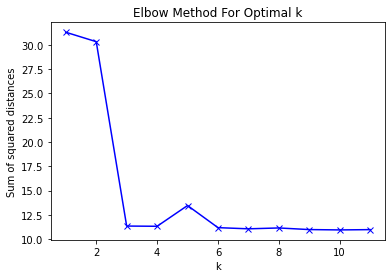

In [518]:
Sum_of_squared_distances=np.array(Sum_of_squared_distances)
K=np.array(K)

plt.plot(K, Sum_of_squared_distances, 'bx-')
plt.xlabel('k')
plt.ylabel('Sum of squared distances')
plt.title('Elbow Method For Optimal k')
plt.show()

From above plot, we can see that plot drops drastically between 2 & 3 and then again rises. At 6 it stabilizes, so I will keep number of clusters = 6 for my analysis

#### Create k clusters and Visualize on map

In [519]:
# set number of clusters
kclusters = 6 # this is optimum value found out from Elbow method above

#la_grouped_clustering = la_grouped.drop('Region', 1)

# run k-means clustering
kmeans = KMeans(init="k-means++", n_clusters=kclusters, random_state=10,n_init=50, max_iter=400).fit(la_grouped_clustering)

# check cluster labels generated for each row in the dataframe
labels= kmeans.labels_
labels
#print(kmeans.labels_)

array([2, 3, 3, 2, 1, 3, 0, 3, 1, 3, 3, 0, 3, 3, 3, 0, 3, 3, 3, 3, 3, 3,
       1, 3, 3, 1, 5, 1, 1, 0, 1, 0, 3, 3, 3, 1, 3, 1, 3, 1, 3, 3, 3, 3,
       3, 3, 2, 3, 1, 3, 1, 3, 1, 3, 1, 3, 3, 2, 3, 0, 5, 0, 2, 3, 3, 2,
       1, 1, 3, 3, 2, 1, 1, 3, 4, 1, 1, 1, 3, 3, 1, 3, 3, 3, 3, 3, 1, 1,
       3, 1, 3, 1, 2, 1, 3, 3, 0, 3, 1, 3, 1, 3, 3, 0, 3, 1, 3, 3, 2, 2,
       3, 2, 3, 3, 2, 3, 1, 3, 3, 3, 2, 1, 3, 1, 3, 1, 3, 1, 1, 1, 3, 1,
       3, 3, 1, 1, 2, 3, 3, 3, 3, 3, 3, 1, 1, 3, 3, 0, 3, 1, 1, 2, 3, 3,
       1, 3, 3, 3, 3, 3, 1, 3, 0, 1, 3, 2, 0, 1, 2, 5, 3, 1, 3, 1, 1, 3,
       1, 1, 1, 3, 3, 5, 3, 2, 3, 2, 1, 3, 3, 3, 3, 4, 2, 1, 2, 0, 3, 2,
       3, 3, 1, 1, 3, 3, 3, 1, 3, 3, 3, 3, 3, 3, 3], dtype=int32)

#### Label each region with corresponding cluster

In [520]:
la_data["Labels"] = kmeans.labels_
la_data.head(5)

,Region,index,Total_cases,population,Case_Percentage,Latitude,Longitude,Labels
0,Acton,0,425,7971,5.33,34.468150,-118.195130,2
1,Adams-Normandie,1,1129,8202,13.76,33.901212,-118.299321,3
2,Agoura Hills,2,930,20883,4.45,34.146110,-118.778120,3
3,Agua Dulce,3,246,4158,5.92,34.495700,-118.326210,2
4,Alhambra,4,6544,86724,7.55,34.094420,-118.127780,1


#### Identify total %age of infected population in each cluster

In [521]:
# Display each cluster with corresponding total cases, population & case percentages
covid_clusters = la_data[['Total_cases', 'population', 'Case_Percentage', 'Labels']].groupby('Labels').mean().T
covid_clusters

Labels,0,1,2,3,4,5
Total_cases,3966.461538,5440.966102,4736.363636,4390.061947,537.00,2413.25
population,31815.000000,49211.305085,30971.590909,41132.902655,8624.00,25956.75
Case_Percentage,11.961538,10.645932,12.121364,9.648230,32.69,6.29


#### Add clustering labels to each region showing corresponding most common venue categories

In [522]:
region_venues_sorted.insert(0,'Cluster Labels', kmeans.labels_)
region_venues_sorted.head()

,Cluster Labels,Region,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,2,Acton,Grocery,Public Service Place,Office/Business Place,Food,Art/Museum,Asian Restaurant,Australian Restaurant,Art/Craft/Flower Shop,Bakery/Breakfast Spot,Bank/ATM
1,3,Adams-Normandie,Food,American Restaurant,Pizza/Salad Place,Sports,Gym/Yoga/Spa,Coffee Shop,Grocery,Sandwich Place,Art/Craft/Flower Shop,Park/Garden/Beach
2,3,Agoura Hills,Furniture / Home Service,Accomodation,Bar/Pub/Liquor Store,Art/Craft/Flower Shop,Fast Food Restaurant,American Restaurant,Gym/Yoga/Spa,Italian Restaurant,Miscellaneous Shopping Place,Cafe
3,2,Agua Dulce,Grocery,American Restaurant,Electronics Store,Mexican Restaurant,Bakery/Breakfast Spot,Pizza/Salad Place,Cafe,Clothing Store,Fast Food Restaurant,European Restaurant
4,1,Alhambra,Asian Restaurant,Grocery,Dessert/Ice Cream Shop,Bakery/Breakfast Spot,Sandwich Place,Bar/Pub/Liquor Store,Public Service Place,Seafood Restaurant,Cafe,American Restaurant


## C. Results

### Step 14: Merge results into single dataframe and visualize results to derive conclusion

#### Create a new dataframe which contains both clusters as well as top 10 venues of each neighbourhood Region

In [523]:
# copy la_data into new dataframe called la_merged
la_merged = la_data

# merge la_data with datafrme above showing each region cluster label along with most common venue categories
la_merged = la_merged.join(region_venues_sorted.set_index('Region'), on='Region')

la_merged.head()

,Region,index,Total_cases,population,Case_Percentage,Latitude,Longitude,Labels,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Acton,0,425,7971,5.33,34.468150,-118.195130,2,2,Grocery,Public Service Place,Office/Business Place,Food,Art/Museum,Asian Restaurant,Australian Restaurant,Art/Craft/Flower Shop,Bakery/Breakfast Spot,Bank/ATM
1,Adams-Normandie,1,1129,8202,13.76,33.901212,-118.299321,3,3,Food,American Restaurant,Pizza/Salad Place,Sports,Gym/Yoga/Spa,Coffee Shop,Grocery,Sandwich Place,Art/Craft/Flower Shop,Park/Garden/Beach
2,Agoura Hills,2,930,20883,4.45,34.146110,-118.778120,3,3,Furniture / Home Service,Accomodation,Bar/Pub/Liquor Store,Art/Craft/Flower Shop,Fast Food Restaurant,American Restaurant,Gym/Yoga/Spa,Italian Restaurant,Miscellaneous Shopping Place,Cafe
3,Agua Dulce,3,246,4158,5.92,34.495700,-118.326210,2,2,Grocery,American Restaurant,Electronics Store,Mexican Restaurant,Bakery/Breakfast Spot,Pizza/Salad Place,Cafe,Clothing Store,Fast Food Restaurant,European Restaurant
4,Alhambra,4,6544,86724,7.55,34.094420,-118.127780,1,1,Asian Restaurant,Grocery,Dessert/Ice Cream Shop,Bakery/Breakfast Spot,Sandwich Place,Bar/Pub/Liquor Store,Public Service Place,Seafood Restaurant,Cafe,American Restaurant


#### For each Region, I will show total # of Venue Category Types

In [524]:
la_venue_count = la_venue_cat_type.groupby(['Region','Venue Category Type']).size().reset_index(name='Counts')
la_venue_count.head()

,Region,Venue Category Type,Counts
0,Acton,Food,1
1,Acton,Grocery,3
2,Acton,Office/Business Place,1
3,Acton,Public Service Place,1
4,Adams-Normandie,American Restaurant,2


#### Now, I will pick top3 venue for each region to estimate frequency of most common venues in each cluster

Note that, reason of picking up top 3 venues is to to get more accurate results instead of relying on first most common venue

In [525]:
top3 = la_venue_count.sort_values(['Region','Counts'],ascending=False).groupby('Region').head(3).reset_index(drop=True)
top3.tail(10)

,Region,Venue Category Type,Counts
589,Agua Dulce,Bakery/Breakfast Spot,1
590,Agoura Hills,Furniture / Home Service,3
591,Agoura Hills,Accomodation,2
592,Agoura Hills,Bar/Pub/Liquor Store,2
593,Adams-Normandie,American Restaurant,2
594,Adams-Normandie,Food,2
595,Adams-Normandie,Art/Craft/Flower Shop,1
596,Acton,Grocery,3
597,Acton,Food,1
598,Acton,Office/Business Place,1


#### Merge top 10 venue names and cluster labels with above dataframe

In [526]:
top_cluster = pd.merge(region_venues_sorted, top3, on="Region", how="outer")
top_cluster.head(10)

,Cluster Labels,Region,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,Venue Category Type,Counts
0,2,Acton,Grocery,Public Service Place,Office/Business Place,Food,Art/Museum,Asian Restaurant,Australian Restaurant,Art/Craft/Flower Shop,Bakery/Breakfast Spot,Bank/ATM,Grocery,3.0
1,2,Acton,Grocery,Public Service Place,Office/Business Place,Food,Art/Museum,Asian Restaurant,Australian Restaurant,Art/Craft/Flower Shop,Bakery/Breakfast Spot,Bank/ATM,Food,1.0
2,2,Acton,Grocery,Public Service Place,Office/Business Place,Food,Art/Museum,Asian Restaurant,Australian Restaurant,Art/Craft/Flower Shop,Bakery/Breakfast Spot,Bank/ATM,Office/Business Place,1.0
3,3,Adams-Normandie,Food,American Restaurant,Pizza/Salad Place,Sports,Gym/Yoga/Spa,Coffee Shop,Grocery,Sandwich Place,Art/Craft/Flower Shop,Park/Garden/Beach,American Restaurant,2.0
4,3,Adams-Normandie,Food,American Restaurant,Pizza/Salad Place,Sports,Gym/Yoga/Spa,Coffee Shop,Grocery,Sandwich Place,Art/Craft/Flower Shop,Park/Garden/Beach,Food,2.0
5,3,Adams-Normandie,Food,American Restaurant,Pizza/Salad Place,Sports,Gym/Yoga/Spa,Coffee Shop,Grocery,Sandwich Place,Art/Craft/Flower Shop,Park/Garden/Beach,Art/Craft/Flower Shop,1.0
6,3,Agoura Hills,Furniture / Home Service,Accomodation,Bar/Pub/Liquor Store,Art/Craft/Flower Shop,Fast Food Restaurant,American Restaurant,Gym/Yoga/Spa,Italian Restaurant,Miscellaneous Shopping Place,Cafe,Furniture / Home Service,3.0
7,3,Agoura Hills,Furniture / Home Service,Accomodation,Bar/Pub/Liquor Store,Art/Craft/Flower Shop,Fast Food Restaurant,American Restaurant,Gym/Yoga/Spa,Italian Restaurant,Miscellaneous Shopping Place,Cafe,Accomodation,2.0
8,3,Agoura Hills,Furniture / Home Service,Accomodation,Bar/Pub/Liquor Store,Art/Craft/Flower Shop,Fast Food Restaurant,American Restaurant,Gym/Yoga/Spa,Italian Restaurant,Miscellaneous Shopping Place,Cafe,Bar/Pub/Liquor Store,2.0
9,2,Agua Dulce,Grocery,American Restaurant,Electronics Store,Mexican Restaurant,Bakery/Breakfast Spot,Pizza/Salad Place,Cafe,Clothing Store,Fast Food Restaurant,European Restaurant,Grocery,2.0


#### Create a dataframe showing frequency of top3 most common venue for each cluster

In [527]:
top_cluster = top_cluster.groupby(['Cluster Labels','Venue Category Type']).size().reset_index(name='Counts')
# transpose to plot bar chart
top3_trans = top_cluster.pivot(index='Cluster Labels',columns='Venue Category Type', values='Counts')
top3_trans = top3_trans.fillna(0).astype(int).reset_index(drop=True)
top3_trans

Venue Category Type,Accomodation,American Restaurant,Art/Craft/Flower Shop,Art/Museum,Asian Restaurant,Bakery/Breakfast Spot,Bank/ATM,Bar/Pub/Liquor Store,Cafe,Clothing Store,...,Pharmacy,Pizza/Salad Place,Public Entertainment Place,Public Service Place,Road/Trail,Salon / Barbershop / Massage,Sandwich Place,Seafood Restaurant,Sports,Vegetarian / Vegan Restaurant
0,0,0,0,1,0,1,0,0,2,1,...,0,1,0,1,2,0,0,0,2,0
1,3,17,1,0,53,22,5,1,1,1,...,0,2,2,4,2,0,4,0,1,0
2,1,5,1,0,3,3,2,2,1,0,...,1,1,0,0,0,1,3,0,0,0
3,6,36,14,3,16,19,6,40,7,10,...,3,5,1,6,2,0,13,1,4,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,2,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,3,0,0,0,2,1


#### Now , I will visualize above data in bar chart below

(array([0, 1, 2, 3, 4, 5]),
 [Text(0, 0, '0'),
  Text(1, 0, '1'),
  Text(2, 0, '2'),
  Text(3, 0, '3'),
  Text(4, 0, '4'),
  Text(5, 0, '5')])

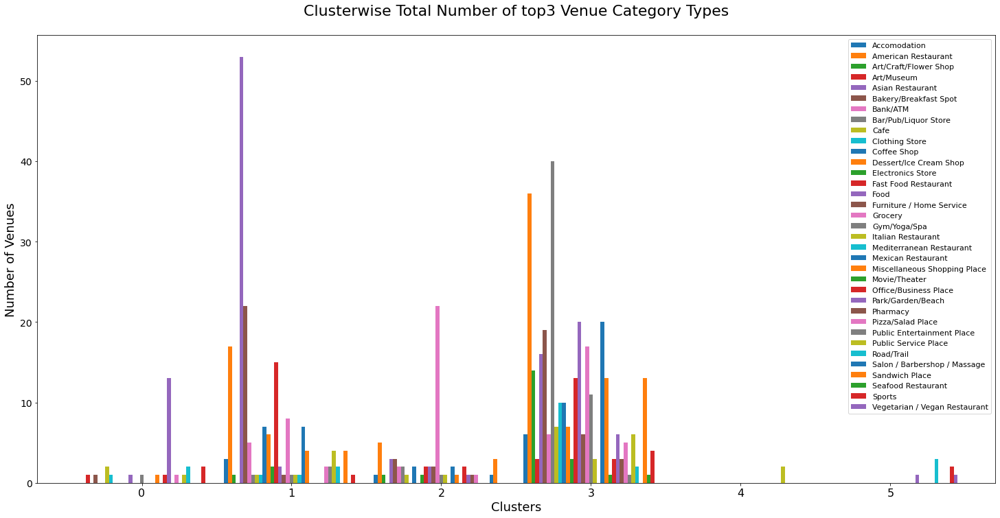

In [528]:
bar_chart= top3_trans.plot(kind='bar',figsize=(25,12),width=0.9)

plt.legend(labels=top3_trans.columns,fontsize=11)
plt.title("Clusterwise Total Number of top3 Venue Category Types\n", fontsize=22)
plt.xlabel("Clusters",fontsize=18)
plt.ylabel("Number of Venues",fontsize=18)
plt.xticks(fontsize=16)
plt.yticks(fontsize=14)
plt.xticks(rotation=0)

From above plot, we can label each cluster as follows :
    
- Cluster 0 : Park/Beach Cluster
- Cluster 1 : Asian Restaurant Cluster
- Cluster 2 : Grocery Cluster
- Cluster 3 : Bar & Food Cluster
- Cluster 4 : Public Service Place Cluster
- Cluster 5 : Road/Trail Cluster

I will display this in dataframe

In [529]:
cluster_labels = {'Clusters': [0,1,2,3,4,5], 'Cluster Title': ["Park/Beach Cluster","Asian Restaurant Cluster","Grocery Cluster","Bar & Food Cluster","Public Service Place Cluster","Road/Trail Cluster"]}
cluster_labels = pd.DataFrame(data=cluster_labels)
cluster_labels

,Clusters,Cluster Title
0,0,Park/Beach Cluster
1,1,Asian Restaurant Cluster
2,2,Grocery Cluster
3,3,Bar & Food Cluster
4,4,Public Service Place Cluster
5,5,Road/Trail Cluster


#### For each Region, I will display total # of venue types 

In [530]:
top3_venue = top3
top3_venue['Venue Types'] = top3_venue['Counts'].map(str) + " " + top3['Venue Category Type']
top3_venue = top3.groupby(['Region'])['Venue Types'].apply(", ".join).reset_index()
top3_venue.head(10)

,Region,Venue Types
0,Acton,"3 Grocery, 1 Food, 1 Office/Business Place"
1,Adams-Normandie,"2 American Restaurant, 2 Food, 1 Art/Craft/Flo..."
2,Agoura Hills,"3 Furniture / Home Service, 2 Accomodation, 2 ..."
3,Agua Dulce,"2 Grocery, 1 American Restaurant, 1 Bakery/Bre..."
4,Alhambra,"7 Asian Restaurant, 4 Grocery, 3 Bakery/Breakf..."
5,Altadena,"2 Food, 2 Grocery, 2 Miscellaneous Shopping Place"
6,Arcadia,"1 Bakery/Breakfast Spot, 1 Miscellaneous Shopp..."
7,Arleta,"1 Art/Craft/Flower Shop, 1 Sandwich Place, 1 S..."
8,Artesia,"22 Asian Restaurant, 4 Grocery, 3 Dessert/Ice ..."
9,Atwater Village,"4 American Restaurant, 3 Asian Restaurant, 3 B..."


#### Validate to enusre none of the cluster labels are null or non-integer value

In [531]:
print('Does any cluster has null value? True if yes, else False: ', la_merged['Cluster Labels'].isnull().values.any())
print ('# of cluster with null value are : ' , la_merged['Cluster Labels'].isnull().sum().sum())

Does any cluster has null value? True if yes, else False:  False
# of cluster with null value are :  0


#### Visualize clusters superimposed on county wise severity map

In [532]:
la_geo = r'la-county-geojason.json'

# create a numpy array of length 6 and has linear spacing from the minium total cases to the maximum total cases
threshold_scale = np.linspace(la_data['Case_Percentage'].min(),
                              la_data['Case_Percentage'].max(),
                              6, dtype=int)

# change the numpy array to a list
threshold_scale = threshold_scale.tolist() 

# Keeping the last value of the list greater than the maximum cases
threshold_scale[-1] = threshold_scale[-1] + 1 

# Keep the focus on Los Angeles in map
la_map = folium.Map(location=[34.0536909, -118.242766], zoom_start=10)
la_map.choropleth(
    geo_data=la_geo,
    data=la_data,
    columns=['Region', 'Case_Percentage'],
    key_on='feature.properties.name',
    threshold_scale=threshold_scale,
    fill_color='YlOrRd', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='Los Angeles Regionwise COVID Case Percentage',
    reset=True
)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 2, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(la_merged['Latitude'], la_merged['Longitude'], la_merged['Region'], la_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
       [lat, lon],
        radius=3,
        popup=label,
       color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
         fill_opacity=0.1).add_to(la_map)
       
la_map

#### Merge important columns in Result Set table

In [533]:
result_set = pd.merge(la_merged[['Region','Case_Percentage','Cluster Labels','1st Most Common Venue','2nd Most Common Venue','3rd Most Common Venue','4th Most Common Venue','5th Most Common Venue']], 
                    top3_venue,
                    left_on = 'Region',
                    right_on = 'Region',
                    how = 'left')

result_set = pd.merge(result_set, 
                    cluster_labels,
                   left_on = 'Cluster Labels',
                    right_on = 'Clusters',
                    how = 'left')

result_set = result_set[['Region','Case_Percentage','Clusters','Cluster Title','Venue Types','1st Most Common Venue','2nd Most Common Venue','3rd Most Common Venue','4th Most Common Venue','5th Most Common Venue']]
result_set.sort_values(by=['Case_Percentage'],ascending=False, inplace=True)
# Display top 5 impacted regions
result_set.head(10)


,Region,Case_Percentage,Clusters,Cluster Title,Venue Types,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
191,Vernon,59.81,4,Public Service Place Cluster,1 Public Service Place,Public Service Place,Vegetarian / Vegan Restaurant,Bar/Pub/Liquor Store,Fast Food Restaurant,European Restaurant
89,Industry,37.07,1,Asian Restaurant Cluster,"3 Asian Restaurant, 2 Food, 2 Mexican Restaurant",Asian Restaurant,Food,Sandwich Place,Mexican Restaurant,Fast Food Restaurant
130,Pacoima,21.42,3,Bar & Food Cluster,"2 Fast Food Restaurant, 1 Clothing Store, 1 Food",Fast Food Restaurant,Food,Clothing Store,Furniture / Home Service,Sandwich Place
152,San Fernando,20.32,3,Bar & Food Cluster,"7 Mexican Restaurant, 4 Dessert/Ice Cream Shop...",Mexican Restaurant,Dessert/Ice Cream Shop,Fast Food Restaurant,Food,Bakery/Breakfast Spot
65,Florence-Firestone,19.66,2,Grocery Cluster,"2 Grocery, 1 Bakery/Breakfast Spot, 1 Bank/ATM",Grocery,Bakery/Breakfast Spot,Mexican Restaurant,Miscellaneous Shopping Place,Bank/ATM
7,Arleta,19.64,3,Bar & Food Cluster,"1 Art/Craft/Flower Shop, 1 Sandwich Place, 1 S...",Sports,Art/Craft/Flower Shop,Sandwich Place,Cafe,Food
22,Boyle Heights,19.48,1,Asian Restaurant Cluster,"2 Asian Restaurant, 2 Bank/ATM, 2 Grocery",Grocery,Bank/ATM,Asian Restaurant,Fast Food Restaurant,Electronics Store
53,East Los Angeles,19.33,3,Bar & Food Cluster,"3 Mexican Restaurant, 2 Dessert/Ice Cream Shop...",Mexican Restaurant,Dessert/Ice Cream Shop,Public Service Place,Pharmacy,Park/Garden/Beach
42,Cudahy,18.96,3,Bar & Food Cluster,1 Bar/Pub/Liquor Store,Bar/Pub/Liquor Store,Cafe,Food,Fast Food Restaurant,European Restaurant
166,South Park,18.67,0,Park/Beach Cluster,1 Park/Garden/Beach,Park/Garden/Beach,Vegetarian / Vegan Restaurant,Cafe,Fast Food Restaurant,European Restaurant


#### Display clusters with corresponding title and COVID case severity

In [534]:
covid_clusters_t = covid_clusters.T # transpose to read column names appropriately
cluster_results = pd.merge(cluster_labels, covid_clusters_t, left_on = 'Clusters', right_on = 'Labels',how = 'inner')
cluster_results

,Clusters,Cluster Title,Total_cases,population,Case_Percentage
0,0,Park/Beach Cluster,3966.461538,31815.000000,11.961538
1,1,Asian Restaurant Cluster,5440.966102,49211.305085,10.645932
2,2,Grocery Cluster,4736.363636,30971.590909,12.121364
3,3,Bar & Food Cluster,4390.061947,41132.902655,9.648230
4,4,Public Service Place Cluster,537.000000,8624.000000,32.690000
5,5,Road/Trail Cluster,2413.250000,25956.750000,6.290000


### Examine clusters

Now, let's examin each cluster with top 10 most common venue here (I will diplay only 3 regions here)

#### Cluster 0 : 

In [535]:
la_merged.loc[la_merged['Cluster Labels'] == 0, la_merged.columns[[0]+[2]+[3]+[4] + list(range(8, la_merged.shape[1]))]].head(3)

,Region,Total_cases,population,Case_Percentage,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
6,Arcadia,3125,65735,4.75,0,Park/Garden/Beach,Miscellaneous Shopping Place,Bakery/Breakfast Spot,Vegetarian / Vegan Restaurant,Fast Food Restaurant,European Restaurant,Electronics Store,Dessert/Ice Cream Shop,Coffee Shop,Clothing Store
11,Avocado Heights,1041,6775,15.37,0,Park/Garden/Beach,Office/Business Place,Vegetarian / Vegan Restaurant,Furniture / Home Service,Fast Food Restaurant,European Restaurant,Electronics Store,Dessert/Ice Cream Shop,Coffee Shop,Clothing Store
15,Bel-Air,351,8429,4.16,0,Cafe,Park/Garden/Beach,Vegetarian / Vegan Restaurant,Fast Food Restaurant,European Restaurant,Electronics Store,Dessert/Ice Cream Shop,Coffee Shop,Clothing Store,Bar/Pub/Liquor Store


#### Cluster 1 : 

In [536]:
la_merged.loc[la_merged['Cluster Labels'] == 1, la_merged.columns[[0]+[2]+[3]+[4] + list(range(8, la_merged.shape[1]))]].head(3)

,Region,Total_cases,population,Case_Percentage,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
4,Alhambra,6544,86724,7.55,1,Asian Restaurant,Grocery,Dessert/Ice Cream Shop,Bakery/Breakfast Spot,Sandwich Place,Bar/Pub/Liquor Store,Public Service Place,Seafood Restaurant,Cafe,American Restaurant
8,Artesia,1939,16795,11.55,1,Asian Restaurant,Grocery,Dessert/Ice Cream Shop,Seafood Restaurant,Art/Craft/Flower Shop,Food,Miscellaneous Shopping Place,American Restaurant,Bakery/Breakfast Spot,Clothing Store
22,Boyle Heights,16928,86884,19.48,1,Grocery,Bank/ATM,Asian Restaurant,Fast Food Restaurant,Electronics Store,Dessert/Ice Cream Shop,Cafe,Bar/Pub/Liquor Store,Bakery/Breakfast Spot,Art/Craft/Flower Shop


#### Cluster 2 : 

In [537]:
la_merged.loc[la_merged['Cluster Labels'] == 2, la_merged.columns[[0]+[2]+[3]+[4] + list(range(8, la_merged.shape[1]))]].head(3)

,Region,Total_cases,population,Case_Percentage,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Acton,425,7971,5.33,2,Grocery,Public Service Place,Office/Business Place,Food,Art/Museum,Asian Restaurant,Australian Restaurant,Art/Craft/Flower Shop,Bakery/Breakfast Spot,Bank/ATM
3,Agua Dulce,246,4158,5.92,2,Grocery,American Restaurant,Electronics Store,Mexican Restaurant,Bakery/Breakfast Spot,Pizza/Salad Place,Cafe,Clothing Store,Fast Food Restaurant,European Restaurant
46,Desert View Highlands,327,2493,13.12,2,Grocery,Gym/Yoga/Spa,American Restaurant,Clothing Store,Food,Fast Food Restaurant,European Restaurant,Electronics Store,Dessert/Ice Cream Shop,Coffee Shop


#### Cluster 3 : 

In [538]:
la_merged.loc[la_merged['Cluster Labels'] == 3, la_merged.columns[[0]+[2]+[3]+[4] + list(range(8, la_merged.shape[1]))]].head(3)

,Region,Total_cases,population,Case_Percentage,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
1,Adams-Normandie,1129,8202,13.76,3,Food,American Restaurant,Pizza/Salad Place,Sports,Gym/Yoga/Spa,Coffee Shop,Grocery,Sandwich Place,Art/Craft/Flower Shop,Park/Garden/Beach
2,Agoura Hills,930,20883,4.45,3,Furniture / Home Service,Accomodation,Bar/Pub/Liquor Store,Art/Craft/Flower Shop,Fast Food Restaurant,American Restaurant,Gym/Yoga/Spa,Italian Restaurant,Miscellaneous Shopping Place,Cafe
5,Altadena,3083,43620,7.07,3,Grocery,Food,Miscellaneous Shopping Place,Pizza/Salad Place,Electronics Store,Furniture / Home Service,Coffee Shop,Mexican Restaurant,Bar/Pub/Liquor Store,Bank/ATM


#### Cluster 4 : 

In [539]:
la_merged.loc[la_merged['Cluster Labels'] == 4, la_merged.columns[[0]+[2]+[3]+[4] + list(range(8, la_merged.shape[1]))]].head(3)

,Region,Total_cases,population,Case_Percentage,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
74,Hancock Park,949,17039,5.57,4,Public Service Place,Vegetarian / Vegan Restaurant,Bar/Pub/Liquor Store,Fast Food Restaurant,European Restaurant,Electronics Store,Dessert/Ice Cream Shop,Coffee Shop,Clothing Store,Cafe
191,Vernon,125,209,59.81,4,Public Service Place,Vegetarian / Vegan Restaurant,Bar/Pub/Liquor Store,Fast Food Restaurant,European Restaurant,Electronics Store,Dessert/Ice Cream Shop,Coffee Shop,Clothing Store,Cafe


#### Cluster 5 : 

In [540]:
la_merged.loc[la_merged['Cluster Labels'] == 5, la_merged.columns[[0]+[2]+[3]+[4] + list(range(8, la_merged.shape[1]))]].head(3)

,Region,Total_cases,population,Case_Percentage,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
26,Calabasas,1099,24323,4.52,5,Road/Trail,Park/Garden/Beach,Vegetarian / Vegan Restaurant,Fast Food Restaurant,European Restaurant,Electronics Store,Dessert/Ice Cream Shop,Coffee Shop,Clothing Store,Cafe
60,Elizabeth Lake,71,1661,4.27,5,Sports,Vegetarian / Vegan Restaurant,Cafe,Food,Fast Food Restaurant,European Restaurant,Electronics Store,Dessert/Ice Cream Shop,Coffee Shop,Clothing Store
169,South Whittier,7928,59222,13.39,5,Sports,Road/Trail,Cafe,Food,Fast Food Restaurant,European Restaurant,Electronics Store,Dessert/Ice Cream Shop,Coffee Shop,Clothing Store


## D. Discussions and Recommendations

I have clustered LA county neighborhood regions based upon top 3 most common surrounding venues and superimposed those clusters on LA county map showing impacted population across various regions. This is very helpful to understand severely impacted regions and which are most common venues around those regions. Similar study can be extended to any other county or locations across the world.

In above study, we could see that elbow point for k value is 3, which again rises and then stabilizes at the value of 6. Hence I have used k=6 (number of clusters) for this analysis. In study above, I have used canberra method to find the distance between two points. This data can be analyzed using other methods as well.

Also, I have used static data to fetch COVID cases across the world, LA county list as well as corresponding case information from LA county portal. This can be fetched dynamically in future studies to retrieve up to date information at any point of time. In above analysis, due to higher size of value categories, I defined venue category type and placed similar venues together in a single bucket. In order to get more detailed view of analysis, this analysis can be extended at more granular level (without bucketing multiple venue into one) which will give more detailed results of COVID impact.

## F. Conclusion

My aim for this study was to identify most common venues in one of the most severely impacted region in the world. In my initial study, I identified USA as the most impacted country in all aspects. After that, I identified California as one of the most severely impacted and most populated state of USA. Hence, I focused our analysis on this state and further identified Los Angeles as most impacted county of California state.

After that, I explored LA county further and identified most common venue across various neighborhood regions of this county. Later I used K-means clustering to create clusters of top three most common venues category types around each region. Finally, I superimposed those clusters on LA county choropleth map, reflecting severity of COVID in terms of percentage of impacted population.

I concluded my analysis with the following results for each cluster -

In [542]:
cluster_results = pd.merge(cluster_labels,covid_clusters_t,left_on = 'Clusters', right_on = 'Labels',how = 'inner')
cluster_results

,Clusters,Cluster Title,Total_cases,population,Case_Percentage
0,0,Park/Beach Cluster,3966.461538,31815.000000,11.961538
1,1,Asian Restaurant Cluster,5440.966102,49211.305085,10.645932
2,2,Grocery Cluster,4736.363636,30971.590909,12.121364
3,3,Bar & Food Cluster,4390.061947,41132.902655,9.648230
4,4,Public Service Place Cluster,537.000000,8624.000000,32.690000
5,5,Road/Trail Cluster,2413.250000,25956.750000,6.290000


With above study, I am able to conclude that - 

- USA is the most impacted country of the world by COVID disease in all aspects (total cases, Number of cases by 100k population, cases in last 7 days..etc)
- California, being the most populated state, is one of the most adversely impacted state of USA by COVID
- Los Angeles is the most impacted county of California, and hence should be focused to analyze further
- Most part of Los Angeles has mixture of various social venues, mostly led by various continental restaurant (Asian, American & Mexican restaurants to be precise)
- In terms of impacted population percentage, cluster 4, where most venues are primarily public service places (like Gas Station, Public transport station, warehouse, laundry) is the worst impacted cluster and need to follow very strict isolation rules
- Cluster 2 with most grocery places and cluster 1 with Asian and other Restaurants are in populated regions and also requires strict isolation rules
- Cluster 0 has more public gathering places like parks and beaches and cluster 3 has more bars/pubs and food places. These two clusters are also candidates for moderately strict regulation rules and can have necessary businesses open with precautions
- Cluster 5 is the least impacted cluster and even though being crowded place, it does not have many social venues nearby except a few Trails, Sport shops..etc and hence least impacted by COVID. This can follow comparatively lighter rules

This study will help our target audience to review the impact of COVID across various regions of LA and decide what is the best strategy to impose isolation rules around various regions and/or type of business.

## G. References

Some of the key references used for this study are mentioned below.

[1]. [WHO COVID Dashboard](https://covid19.who.int/)  

[2]. [Worldometer COVID Dashboard](https://www.worldometers.info) 

[3]. [LA County COVID Dashboard](http://dashboard.publichealth.lacounty.gov/covid19_surveillance_dashboard/)    

[4]. [LA County Regions Location Coordinates](https://apps.gis.ucla.edu/geodata/dataset/los-angeles-county-neighborhoods) 

[5]. [Foursquare API](https://developer.foursquare.com/)  